# Self-Driving Car Engineer Nanodegree


**Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
---

## Import Packages

In [1]:
#importing packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import cv2
import glob
import pickle

%matplotlib inline

## Camera Calibration

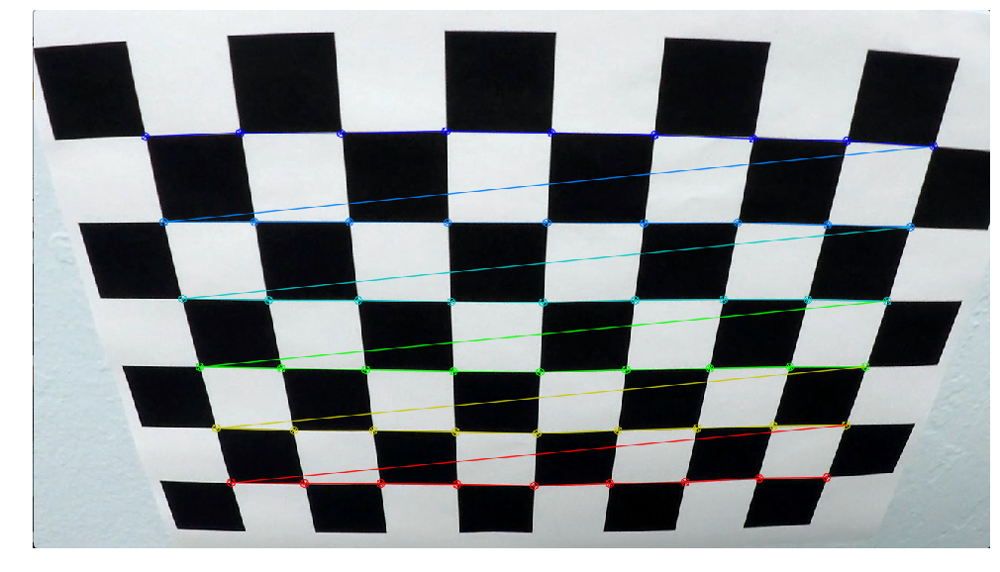

In [2]:
nx = 9
ny = 6
objpoints = []
imgpoints = [] 

# Load calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Create object points 
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2) # x, y co-ordinates.

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If detected, add to arrays.
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
    # Show example    
    if i == 11:
        fig, ax = plt.subplots(figsize=(20,10))
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        ax.axis('off')
        ax.imshow(img)

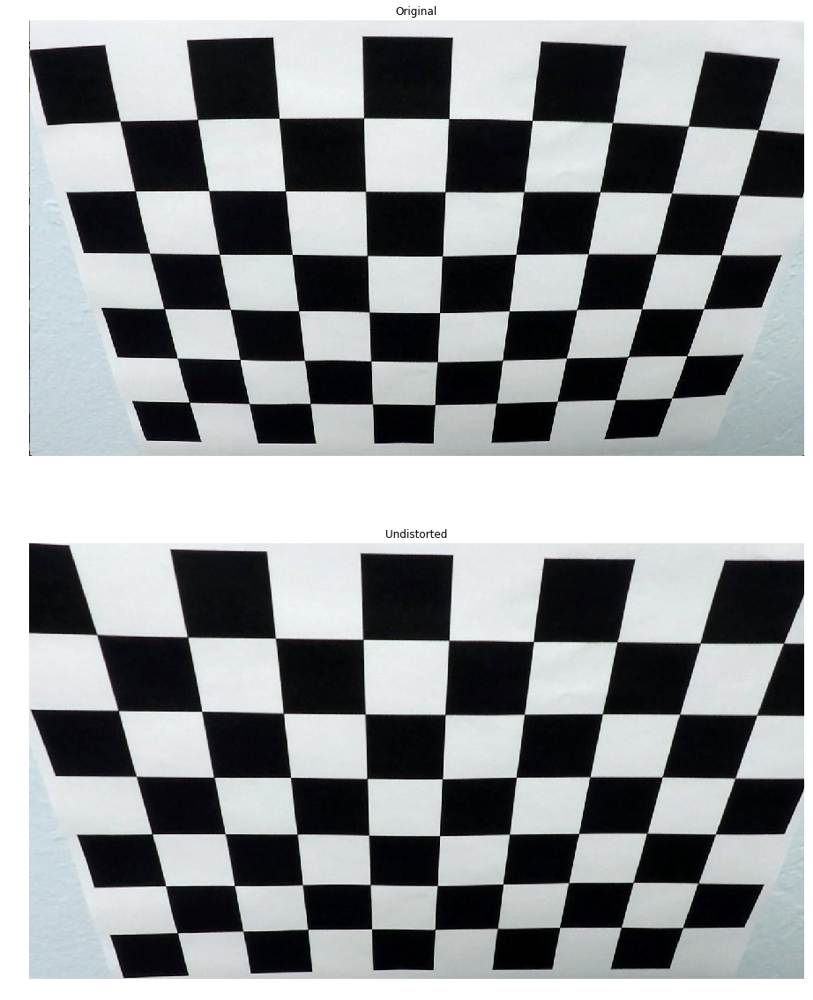

In [3]:
# Read previous example image
img = cv2.imread('./camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# Show undistortion on example image
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,20))
ax1.axis('off')
ax1.imshow(img)
ax1.set_title('Original')
ax2.axis('off')
ax2.imshow(dst)
ax2.set_title('Undistorted')
plt.show()

## Test Images Pipeline

#### Functions

In [40]:
def undistort(img):
    # Undistort images
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

def birdseye(img, src, dst):
    # Perspective transform to bird's eye view
    h,w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

def lab_l_color(img, thresh=(210, 255)):
    # Convert to LAB-L
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab_l = lab[:,:,0]
    lab_l = lab_l*(255/np.max(lab_l))
    binary_image = np.zeros_like(lab_l)
    binary_image[(lab_l > thresh[0]) & (lab_l <= thresh[1])] = 1
    return binary_image

def lab_b_color(img, thresh=(185,255)):
    # Convert to LAB-B
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_image = np.zeros_like(lab_b)
    binary_image[(lab_b > thresh[0]) & (lab_b <= thresh[1])] = 1
    return binary_image

def process(img):
    img_undistort = undistort(img)
    img_birdseye, M, Minv = birdseye(img_undistort, src, dst)
    img_L = lab_l_color(img_birdseye)
    img_B = lab_b_color(img_birdseye)
    combined = np.zeros_like(img_B)
    combined[(img_L == 1) | (img_B == 1)] = 1
    return combined, Minv

def window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    # Removes the left and right quarter of the image, considering only the center half of the image
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    # Number of sliding windows
    nwindows = 9
    # Height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & 
                         (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & 
                         (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    lfit, rfit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        lfit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        rfit = np.polyfit(righty, rightx, 2)
    
    visual = (rectangle_data, histogram)
    
    return lfit, rfit, left_lane_inds, right_lane_inds, visual

def previous_polyfit(img, lfit_prev, rfit_prev):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (lfit_prev[0]*(nonzeroy**2) + lfit_prev[1]*nonzeroy + lfit_prev[2] - margin)) & 
                      (nonzerox < (lfit_prev[0]*(nonzeroy**2) + lfit_prev[1]*nonzeroy + lfit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (rfit_prev[0]*(nonzeroy**2) + rfit_prev[1]*nonzeroy + rfit_prev[2] - margin)) & 
                      (nonzerox < (rfit_prev[0]*(nonzeroy**2) + rfit_prev[1]*nonzeroy + rfit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    lfit_new, rfit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        lfit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        rfit_new = np.polyfit(righty, rightx, 2)
    return lfit_new, rfit_new, left_lane_inds, right_lane_inds

def curvature(img, l_fit, r_fit, left_lane_inds, right_lane_inds):
    h = img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Define conversions in x and y from pixels space to meters
    y_metppix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    x_metppix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    lcurve, rcurve, cdist = (0, 0, 0)
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*y_metppix, leftx*x_metppix, 2)
        right_fit_cr = np.polyfit(righty*y_metppix, rightx*x_metppix, 2)
        # Calculate the new radii of curvature
        lcurve = ((1 + (2*left_fit_cr[0]*y_eval*y_metppix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        rcurve = ((1 + (2*right_fit_cr[0]*y_eval*y_metppix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center of the lane
    if r_fit is not None and l_fit is not None:
        vehicle_center = img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center = (r_fit_x_int + l_fit_x_int) /2
        dist = (vehicle_center - lane_center) * x_metppix
    return lcurve, rcurve, dist

def draw_lane(original_img, binary_img, l_fit, r_fit, Minv, curve, dist):
    new_img = np.copy(original_img)
    final_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    lfitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    rfitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([lfitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rfitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    final_img = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)

    text = 'Curvature: ' + '{:04.2f}'.format(curve) + 'm'
    cv2.putText(final_img, text, (30,50), 4, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Position: ' + '{:04.3f}'.format(dist) + 'm '
    cv2.putText(final_img, text, (30,100), 4, 1, (255,255,255), 2, cv2.LINE_AA)
    return final_img

#### Code

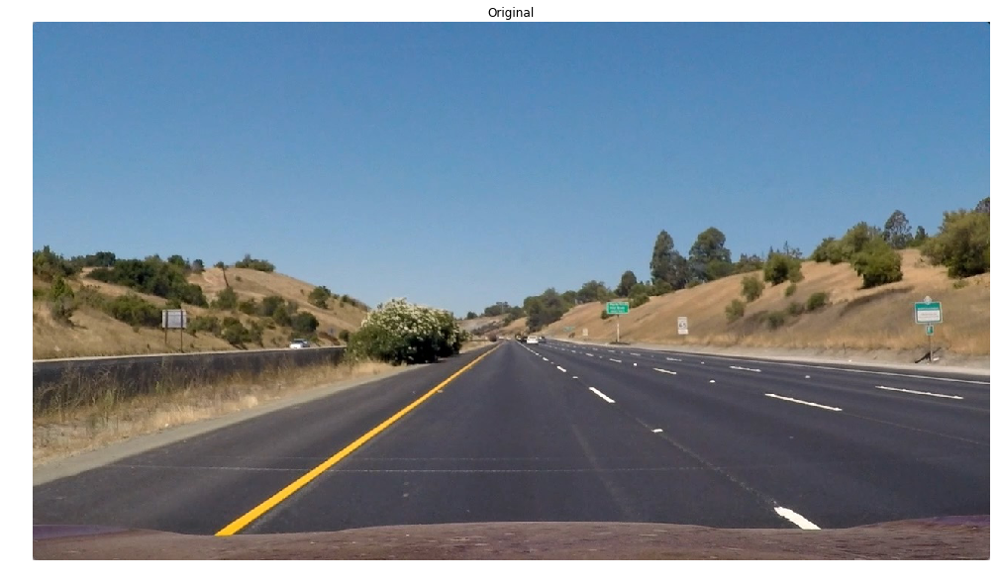

In [5]:
# Example image
img_org = cv2.imread('./test_images/straight_lines1.jpg')
img_org = cv2.cvtColor(img_org, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize=(20,10))
ax.axis('off')
ax.imshow(img_org)
ax.set_title('Original')

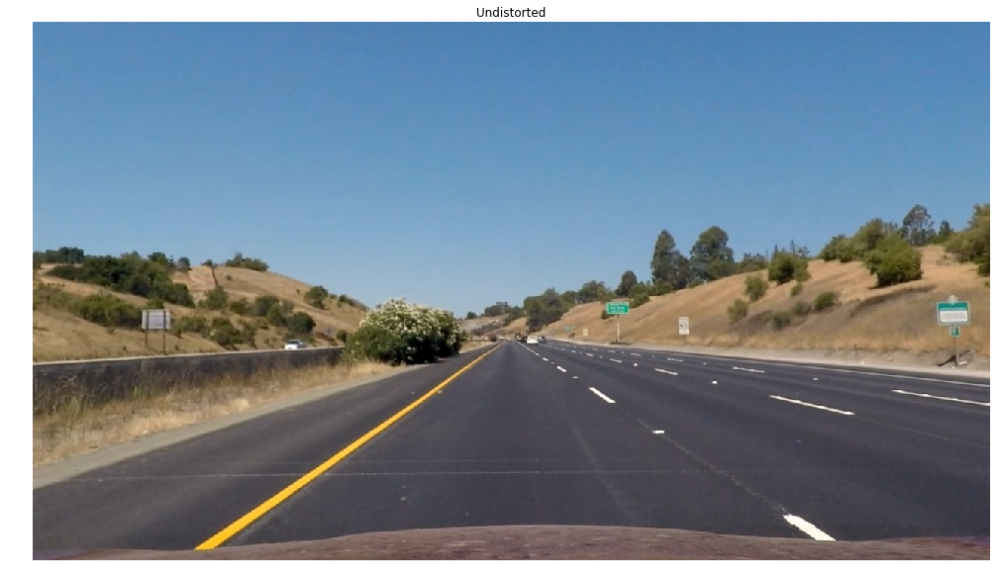

In [6]:
# Undistorted Image.
img_undist = undistort(img_org)

fig, ax = plt.subplots(figsize=(20,10))
ax.axis('off')
ax.imshow(img_undist)
ax.set_title('Undistorted')

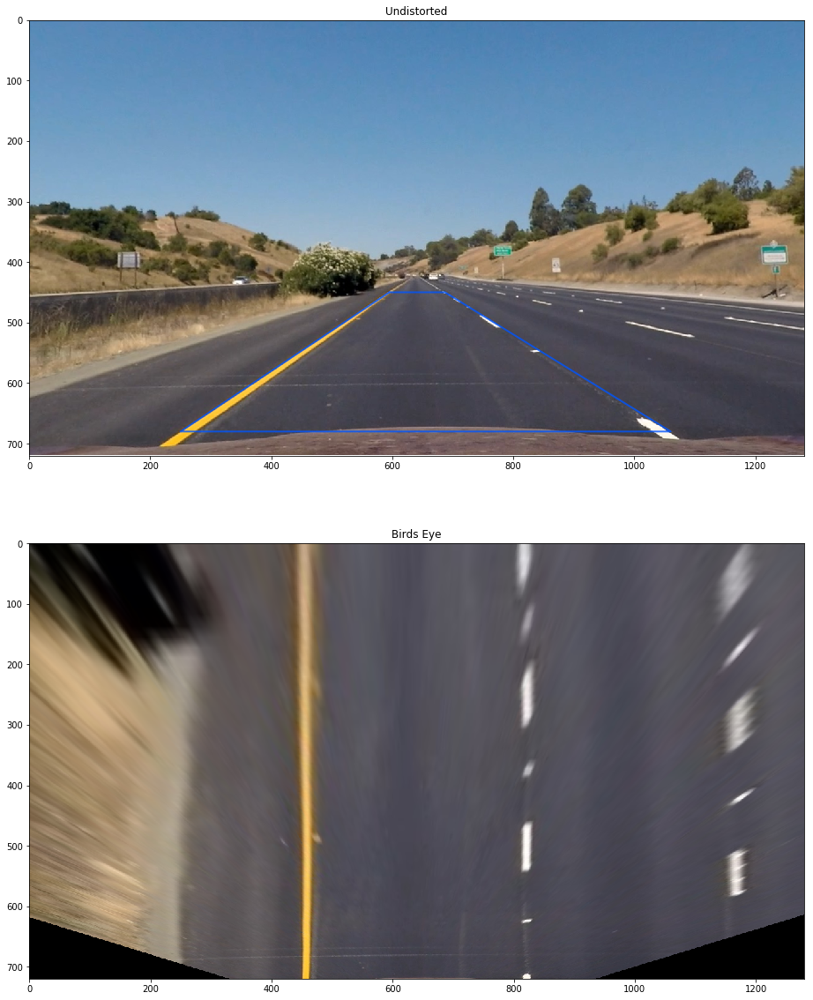

In [7]:
# Visualize Perspective Transform
h,w = img_undist.shape[:2]
# define source and destination points for transform
src = np.float32([(595,450), (687,450), (250,680), (1060,680)])
dst = np.float32([(450,0), (w-450,0), (450,h), (w-450,h)])

img_birdseye, M, Minv = birdseye(img_undist, src, dst)

# Visualize unwarp
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,20))
ax1.imshow(img_undist)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#0055ff', alpha=0.8, linewidth=2, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted')
ax2.imshow(img_birdseye)
ax2.set_title('Birds Eye')
plt.show()

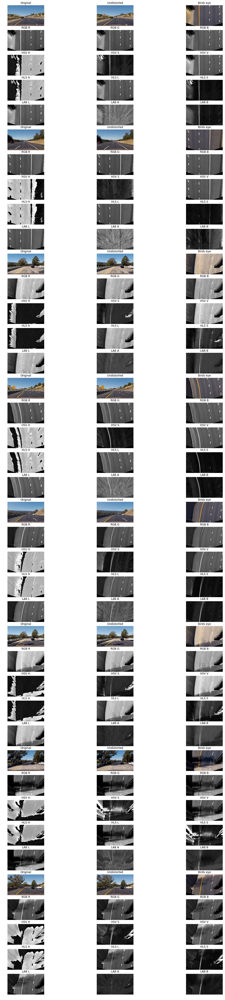

In [8]:
# Make a list of example images
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, ax = plt.subplots(len(images)*5,3, figsize=(20, 80))
ax = ax.ravel()

i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistort = undistort(img)
    img_birdseye, M, Minv = birdseye(img_undistort, src, dst)

    # Visualize RGB, HSV, HLS, LAB
    img_birdseye_R = img_birdseye[:,:,0]
    img_birdseye_G = img_birdseye[:,:,1]
    img_birdseye_B = img_birdseye[:,:,2]
    img_birdseye_HSV = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2HSV)
    img_birdseye_HSV_H = img_birdseye_HSV[:,:,0]
    img_birdseye_HSV_S = img_birdseye_HSV[:,:,1]
    img_birdseye_HSV_V = img_birdseye_HSV[:,:,2]
    img_birdseye_HLS = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2HLS)
    img_birdseye_HLS_H = img_birdseye_HLS[:,:,0]
    img_birdseye_HLS_L = img_birdseye_HLS[:,:,1]
    img_birdseye_HLS_S = img_birdseye_HLS[:,:,2]
    img_birdseye_LAB = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2Lab)
    img_birdseye_LAB_L = img_birdseye_LAB[:,:,0]
    img_birdseye_LAB_A = img_birdseye_LAB[:,:,1]
    img_birdseye_LAB_B = img_birdseye_LAB[:,:,2]

    # Plotting
    ax[i].imshow(img)
    ax[i].set_title('Original')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_undistort)
    ax[i].set_title('Undistorted')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye)
    ax[i].set_title('Birds eye')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_R, cmap='gray')
    ax[i].set_title('RGB R')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_G, cmap='gray')
    ax[i].set_title('RGB G')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_B, cmap='gray')
    ax[i].set_title('RGB B')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HSV_H, cmap='gray')
    ax[i].set_title('HSV H')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HSV_S, cmap='gray')
    ax[i].set_title('HSV S')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HSV_V, cmap='gray')
    ax[i].set_title('HSV V')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HLS_H, cmap='gray')
    ax[i].set_title('HLS H')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HLS_L, cmap='gray')
    ax[i].set_title('HLS L')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HLS_S, cmap='gray')
    ax[i].set_title('HLS S')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_LAB_L, cmap='gray')
    ax[i].set_title('LAB L')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_LAB_A, cmap='gray')
    ax[i].set_title('LAB A')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_LAB_B, cmap='gray')
    ax[i].set_title('LAB B')
    ax[i].axis('off')
    i += 1

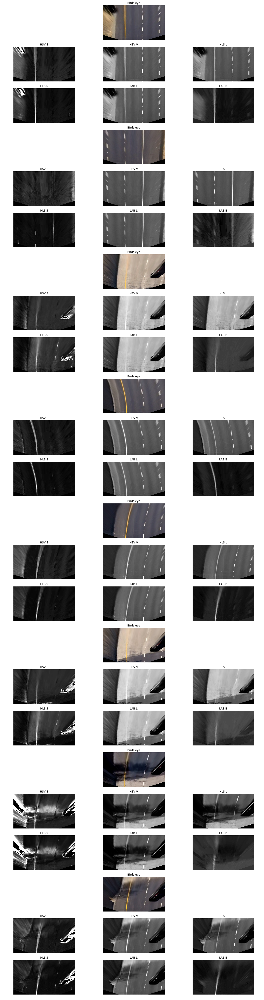

In [9]:
# Plotting likely candidates for image processing
fig, ax = plt.subplots(len(images)*3,3, figsize=(20, 80))
ax = ax.ravel()

i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistort = undistort(img)
    img_birdseye, M, Minv = birdseye(img_undistort, src, dst)

    # Visualize RGB, HSV, HLS, LAB
    img_birdseye_R = img_birdseye[:,:,0]
    img_birdseye_G = img_birdseye[:,:,1]
    img_birdseye_B = img_birdseye[:,:,2]
    img_birdseye_HSV = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2HSV)
    img_birdseye_HSV_H = img_birdseye_HSV[:,:,0]
    img_birdseye_HSV_S = img_birdseye_HSV[:,:,1]
    img_birdseye_HSV_V = img_birdseye_HSV[:,:,2]
    img_birdseye_HLS = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2HLS)
    img_birdseye_HLS_H = img_birdseye_HLS[:,:,0]
    img_birdseye_HLS_L = img_birdseye_HLS[:,:,1]
    img_birdseye_HLS_S = img_birdseye_HLS[:,:,2]
    img_birdseye_LAB = cv2.cvtColor(img_birdseye, cv2.COLOR_RGB2Lab)
    img_birdseye_LAB_L = img_birdseye_LAB[:,:,0]
    img_birdseye_LAB_A = img_birdseye_LAB[:,:,1]
    img_birdseye_LAB_B = img_birdseye_LAB[:,:,2]

    # Plotting
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye)
    ax[i].set_title('Birds eye')
    ax[i].axis('off')
    i += 1
    ax[i].axis('off')    
    i += 1
    ax[i].imshow(img_birdseye_HSV_S, cmap='gray')
    ax[i].set_title('HSV S')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HSV_V, cmap='gray')
    ax[i].set_title('HSV V')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HLS_L, cmap='gray')
    ax[i].set_title('HLS L')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_HLS_S, cmap='gray')
    ax[i].set_title('HLS S')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_LAB_L, cmap='gray')
    ax[i].set_title('LAB L')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(img_birdseye_LAB_B, cmap='gray')
    ax[i].set_title('LAB B')
    ax[i].axis('off')
    i += 1

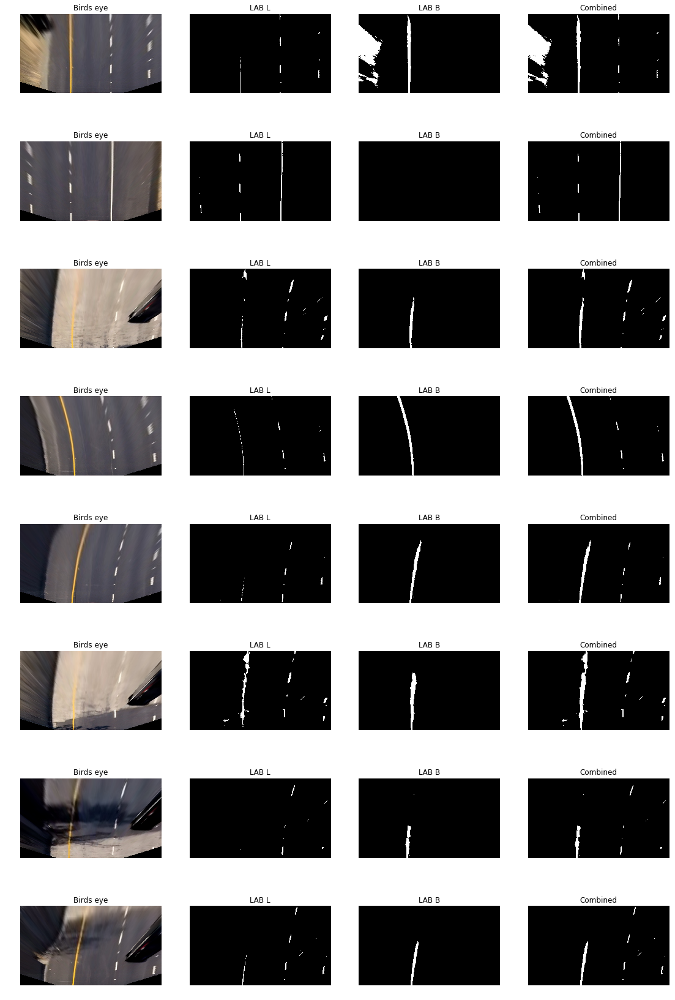

In [10]:
fig, ax = plt.subplots(len(images),4, figsize=(19, 30))
ax = ax.ravel()

i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistort = undistort(img)
    img_birdseye, M, Minv = birdseye(img_undistort, src, dst)

# Visualize L Channel threshold
    img_L_color = lab_l_color(img_birdseye)
    img_B_color = lab_b_color(img_birdseye)
    merge = np.zeros_like(img_B_color)
    merge[(img_L_color == 1) | (img_B_color == 1)] = 1
    ax[i].imshow(img_birdseye)
    ax[i].set_title('Birds eye')
    ax[i].axis('off')
    i += 1 
    ax[i].imshow(img_L_color, cmap='gray')
    ax[i].set_title('LAB L')
    ax[i].axis('off')
    i += 1    
    ax[i].imshow(img_B_color, cmap='gray')
    ax[i].set_title('LAB B')
    ax[i].axis('off')
    i += 1
    ax[i].imshow(merge, cmap='gray')
    ax[i].set_title('Combined')
    ax[i].axis('off')
    i += 1   

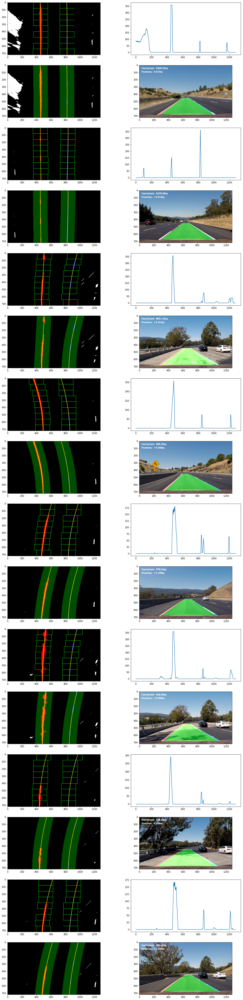

In [43]:
fig, ax = plt.subplots(len(images) + len(images),2, figsize=(19, 80))
ax = ax.ravel()

i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistort = undistort(img)
    img_bin, Minv = process(img)
    
    lfit, rfit, left_lindx, right_lindx, visualization_data = window_polyfit(img_bin)

    h = img.shape[0]
    lfit_x = lfit[0]*h**2 + lfit[1]*h + lfit[2]
    rfit_x = rfit[0]*h**2 + rfit[1]*h + rfit[2]
    rectangles = visualization_data[0]
    histogram = visualization_data[1]

    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((img_bin, img_bin, img_bin))*255)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_bin.shape[0]-1, img_bin.shape[0] )
    lfitx = lfit[0]*ploty**2 + lfit[1]*ploty + lfit[2]
    rfitx = rfit[0]*ploty**2 + rfit[1]*ploty + rfit[2]
    for rect in rectangles:
    # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lindx], nonzerox[left_lindx]] = [255, 0, 0]
    out_img[nonzeroy[right_lindx], nonzerox[right_lindx]] = [0, 0, 255]
    ax[i].imshow(out_img)
    ax[i].plot(lfitx, ploty, color='yellow')
    ax[i].plot(rfitx, ploty, color='yellow')
    i += 1 
    ax[i].plot(histogram)
    i += 1    
    
    lfit2, rfit2, left_lane_inds, right_lane_inds = previous_polyfit(img_bin, lfit, rfit)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_bin.shape[0]-1, img_bin.shape[0] )
    lfitx = lfit[0]*ploty**2 + lfit[1]*ploty + lfit[2]
    rfitx = rfit[0]*ploty**2 + rfit[1]*ploty + rfit[2]
    lfitx2 = lfit2[0]*ploty**2 + lfit2[1]*ploty + lfit2[2]
    rfitx2 = rfit2[0]*ploty**2 + rfit2[1]*ploty + rfit2[2]

    # Create an image to draw on and an image to show the selection window
    out_img2 = np.uint8(np.dstack((img_bin, img_bin, img_bin))*255)
    window_img2 = np.zeros_like(out_img)

    # Color in left and right line pixels
    nonzero = img_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img2[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img2[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area (OLD FIT)
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_window1 = np.array([np.transpose(np.vstack([lfitx-margin, ploty]))])
    left_window2 = np.array([np.flipud(np.transpose(np.vstack([lfitx+margin, ploty])))])
    left_line_pts = np.hstack((left_window1, left_window2))
    right_window1 = np.array([np.transpose(np.vstack([rfitx-margin, ploty]))])
    right_window2 = np.array([np.flipud(np.transpose(np.vstack([rfitx+margin, ploty])))])
    right_line_pts = np.hstack((right_window1, right_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img2, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img2, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img2, 1, window_img2, 0.3, 0)
    ax[i].imshow(result)
    ax[i].plot(lfitx, ploty, color='yellow')
    ax[i].plot(rfitx, ploty, color='yellow')
    i += 1    
    
    rad_l, rad_r, center = curvature(img_bin, lfit, rfit, left_lane_inds, right_lane_inds)

    img_draw = draw_lane(img, img_bin, lfit, rfit, Minv, (rad_l+rad_r)/2, center)
    ax[i].imshow(img_draw)
    ax[i].plot()
    i += 1

## Test Videos Pipeline

In [55]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.all = None
        
    def fits(self, fit, inds):
        if fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:                
                self.detected = False
            else:
                self.detected = True
                self.all = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)

def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = process(new_img)
    
    # Search for fit
    if not left_lane.detected or not right_lane.detected:
        l_fit, r_fit, left_lane_inds, right_lane_inds, _ = window_polyfit(img_bin)
    # Use previous fit
    else:
        l_fit, r_fit, left_lane_inds, right_lane_inds = previous_polyfit(img_bin, left_lane.best_fit, right_lane.best_fit)
        

    if l_fit is not None and r_fit is not None:
        # Calculate x-intercept
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    left_lane.fits(l_fit, left_lane_inds)
    right_lane.fits(r_fit, right_lane_inds)
    
    # Draw
    if left_lane.best_fit is not None and right_lane.best_fit is not None:
        rad_l, rad_r, center = curvature(img_bin, left_lane.best_fit, right_lane.best_fit, left_lane_inds, right_lane_inds)
        img_out = draw_lane(new_img, img_bin, left_lane.best_fit, right_lane.best_fit, Minv, (rad_l+rad_r)/2, center)
    else:
        img_out = new_img
    
    return img_out

def process_video(in_vid, out_vid):
    vid_in = VideoFileClip(in_vid)
    vid_out = vid_in.fl_image(process_image)
    vid_out.write_videofile(out_vid, audio=False)
    print('Completed')

In [56]:
# Main Function
left_lane = Line()
right_lane = Line()
test_videos = ['project_video.mp4',  'challenge_video.mp4', 'harder_challenge_video.mp4']
video_output = ['project_video_out.mp4',  'challenge_video_out.mp4', 'harder_challenge_video_out.mp4']

process_video(test_videos, video_output)
print('Done')

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4



 25%|██▌       | 321/1261 [00:40<02:04,  7.55it/s]


 51%|█████     | 641/1261 [01:22<01:22,  7.50it/s]


 76%|███████▌  | 961/1261 [02:04<00:39,  7.60it/s]


100%|█████████▉| 1260/1261 [02:44<00:00,  7.62it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Output Files Write Complete.
[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4



 68%|██████▊   | 328/485 [00:43<00:21,  7.40it/s]


 86%|████████▌ | 417/485 [00:56<00:09,  7.38it/s]

ValueError: On entry to DGELSD parameter number 4 had an illegal value